In [1]:
import os
import sys
import numpy as np
import pandas as pd
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [2]:
os.sys.path.append("../") # need to add modules to path

# local imports
from prepare import prepare
from file_io import czi_reader
from file_io import ome_writer
from utils import tools
from segment import cell_detector

In [12]:
"""
Information CZI Dimension Characters:
- '0': 'Sample',  # e.g. RGBA
- 'X': 'Width',
- 'Y': 'Height',
- 'C': 'Channel',
- 'Z': 'Slice',  # depth
- 'T': 'Time',
- 'R': 'Rotation',
- 'S': 'Scene',  # contiguous regions of interest in a mosaic image
- 'I': 'Illumination',  # direction
- 'B': 'Block',  # acquisition
- 'M': 'Mosaic',  # index of tile for compositing a scene
- 'H': 'Phase',  # e.g. Airy detector fibers
- 'V': 'View',  # e.g. for SPIM
"""

"\nInformation CZI Dimension Characters:\n- '0': 'Sample',  # e.g. RGBA\n- 'X': 'Width',\n- 'Y': 'Height',\n- 'C': 'Channel',\n- 'Z': 'Slice',  # depth\n- 'T': 'Time',\n- 'R': 'Rotation',\n- 'S': 'Scene',  # contiguous regions of interest in a mosaic image\n- 'I': 'Illumination',  # direction\n- 'B': 'Block',  # acquisition\n- 'M': 'Mosaic',  # index of tile for compositing a scene\n- 'H': 'Phase',  # e.g. Airy detector fibers\n- 'V': 'View',  # e.g. for SPIM\n"

# Data Loading
 Load data from `.czi` file format into convient `numpy` arrays.


In [4]:
reload(czi_reader)

# test image
TEST_PATH = "../../Data/test/3x3-extract-Scene6-07-14to15.czi"

# czi file loader
czi = czi_reader.CZILoader(TEST_PATH)

# cleaned scene
czi.restructure_scene(scene=0)
scene0 = czi.scene

print(czi.channel_names)
print(scene0.shape)

['AF514', 'mCher', 'H3342', 'Oblique']
(49, 9, 472, 640, 4)


(-0.5, 639.5, 471.5, -0.5)

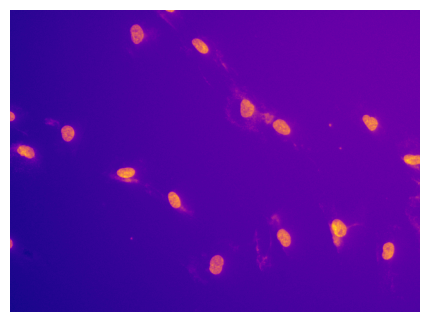

In [5]:
"""
plot an example to make sure we're sane
"""

matplotlib.rcParams['figure.dpi'] = 100
TIME = 0
CHANNEL = 2 # blue channel
TILE = 8

test = scene0[TIME, TILE, :, :, CHANNEL]
plt.imshow(test, cmap='plasma')
plt.axis(False)


# Preprocessing

A few functions to clean up individual images.

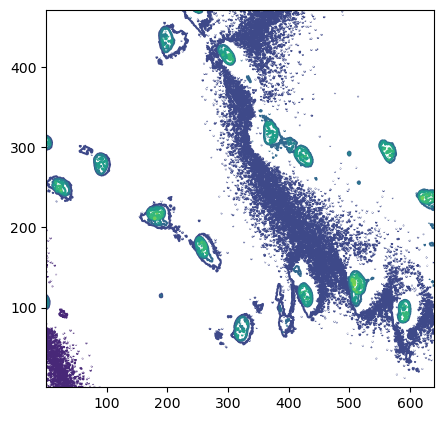

In [6]:
reload(prepare)

prepare.plot_contour(test)

(-0.5, 639.5, 471.5, -0.5)

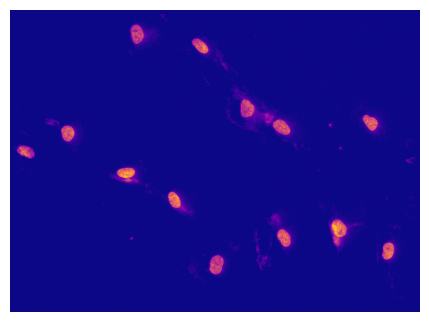

In [7]:
reload(prepare)

test_processed = prepare.transform(test)

plt.imshow(test_processed, cmap='plasma')
plt.axis(False)

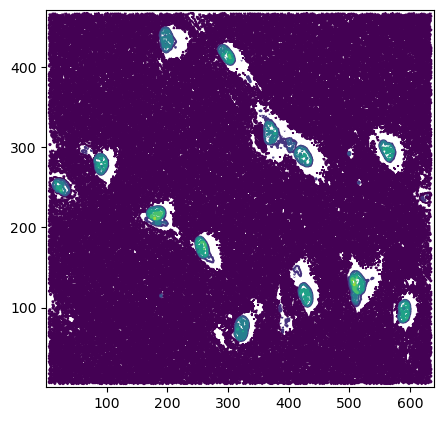

In [8]:
prepare.plot_contour(test_processed)

# Sample OME.tiff saving

A test on saving a OME .tiff format image after processing

In [9]:
"""
process a whole scene
"""

CHANNEL = 2

# cheap processing
processed_scene = scene0.copy()

for tile in range(9):
    for i in range(49):
        processed_scene[i, tile, :, :, CHANNEL] = prepare.transform(processed_scene[i, tile, :, :, CHANNEL])


In [19]:
# reload(OME_writer)

# # save the results to ome.tiff format
# ome = ome_writer.OME_writer(processed_scene)
# ome.restructure_scene()

# ome.write("../../Data/test/test.ome.tiff")

# Handling Mosaics

Reconstructing the full field of view

In [10]:
reload(tools)

# raw image
blocker = tools.SceneBlocker(scene0)
blocked_scene = blocker.block()
print(blocked_scene.shape)

# processed image
blocker = tools.SceneBlocker(processed_scene)
blocked_scene_p = blocker.block()
print(blocked_scene_p.shape)

(49, 1416, 1920, 4)
(49, 1416, 1920, 4)


(-0.5, 1919.5, 1415.5, -0.5)

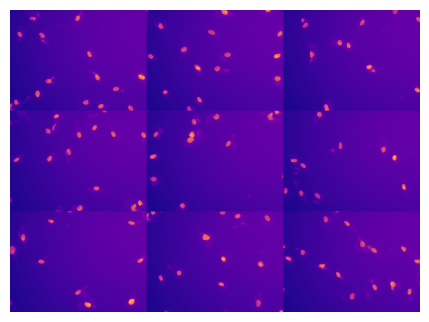

In [21]:
TIME = 0
CHANNEL = 2

img = blocked_scene[TIME, :, :, CHANNEL]

plt.imshow(img, cmap="plasma")
plt.axis(False)

(-0.5, 1919.5, 1415.5, -0.5)

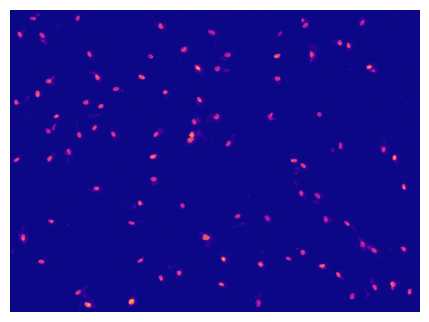

In [11]:
TIME = 0
CHANNEL = 2

img = blocked_scene_p[TIME, :, :, CHANNEL]

plt.imshow(img, cmap="plasma")
plt.axis(False)

# Cell Detection

13

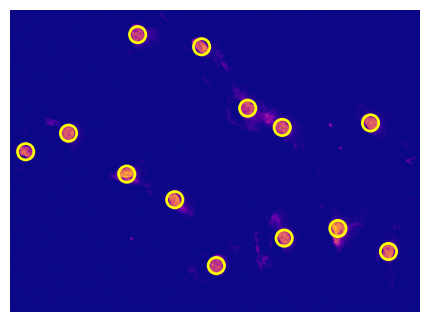

In [12]:
reload(cell_detector)
reload(prepare)

processed = prepare.transform(test)

# detect some cells and plot using LoG
cells = cell_detector.get_cells_LoG(processed)
cell_detector.plot_cells_LoG(processed, cells)

len(cells)

94

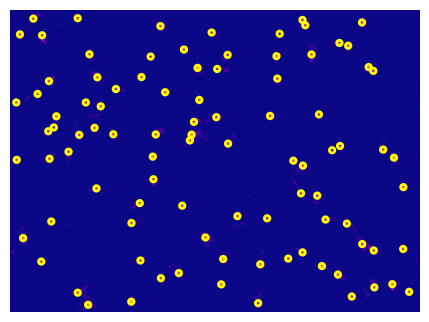

In [13]:
reload(cell_detector)

TIME = 0
CHANNEL = 2

# detect some cells and plot
frame = blocked_scene_p[TIME, :, :, CHANNEL]

cells = cell_detector.get_cells_LoG(frame)
cell_detector.plot_cells_LoG(frame, cells)

len(cells)

In [30]:
"""
basic attempt at single tile tracking 
"""

TILE = 0
CHANNEL = 2

tile_test = scene0[:, TILE, :, :, CHANNEL]


# get cells at each time
cell_list = []

for t in range(49):
    img = tile_test[t]
    img = prepare.transform(img)
    cells = cell_detector.get_cells_LoG(img)
    print(f"time: {t}, n={len(cells)}")
    cell_list.append(cells)

time: 0, n=13
time: 1, n=12
time: 2, n=12
time: 3, n=13
time: 4, n=10
time: 5, n=9
time: 6, n=11
time: 7, n=11
time: 8, n=12
time: 9, n=11
time: 10, n=9
time: 11, n=9
time: 12, n=9
time: 13, n=8
time: 14, n=8
time: 15, n=8
time: 16, n=9
time: 17, n=9
time: 18, n=10
time: 19, n=10
time: 20, n=11
time: 21, n=9
time: 22, n=9
time: 23, n=8
time: 24, n=8
time: 25, n=7
time: 26, n=6
time: 27, n=7
time: 28, n=8
time: 29, n=8
time: 30, n=8
time: 31, n=8
time: 32, n=8
time: 33, n=7
time: 34, n=7
time: 35, n=7
time: 36, n=8
time: 37, n=9
time: 38, n=10
time: 39, n=9
time: 40, n=9
time: 41, n=9
time: 42, n=9
time: 43, n=10
time: 44, n=10
time: 45, n=10
time: 46, n=8
time: 47, n=7
time: 48, n=9


# Simple Animation 
A few simple tools to create vizualizations from scenes.

In [12]:
# """
# simple animation: save to gif.
# """

# reload(animate_funcs)

# outpath = "../../Figures/test.gif"

# # create viz
# animate_funcs.simple_giffer(scene=scene0, 
#                             tile=0, 
#                             channel=2, 
#                             outpath=outpath, 
#                             fps=20)

# # display viz
# Image(outpath)

In [13]:
# """
# simple animation for Jupyter only
# """

# reload(animate_funcs)

# # create viz
# animate_funcs.jupyterlab_video(scene=scene0, 
#                             tile=0, 
#                             channel=2)



In [14]:
# """
# simple animation of a whole plate
# """

# reload(animate_funcs)


# outpath = "../../Figures/test_plate_raw.gif"

# # create viz
# animate_funcs.whole_plate_giffer(blocked_scene=blocked_scene, 
#                                  channel=2, 
#                                  outpath=outpath, 
#                                  fps=20)

# # display viz
# Image(outpath)